In [2]:

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CyclicLR
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from glob import glob
from skimage.io import imread
from os import listdir
import time
import copy
from tqdm import tqdm_notebook as tqdm

In [3]:
run_training = False
retrain = False
find_learning_rate = False

In [4]:
files = listdir("archive (3)")
print(len(files))

280


In [5]:
files[0:10]

['9036',
 '10268',
 '10257',
 '8913',
 '13613',
 '8914',
 '15510',
 '10259',
 '16165',
 '10292']

In [6]:
files = listdir("archive (3)/IDC_regular_ps50_idx5/")
len(files)

279

In [7]:
base_path = "archive (3)/IDC_regular_ps50_idx5/"
folder = listdir(base_path)
len(folder)

279

In [8]:
total_images = 0
for n in range(len(folder)):
    patient_id = folder[n]
    for c in [0, 1]:
        patient_path = base_path + patient_id 
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        total_images += len(subfiles)

In [9]:
total_images

277524

In [10]:
data = pd.DataFrame(index=np.arange(0, total_images), columns=["patient_id", "path", "target"])

k = 0
for n in range(len(folder)):
    patient_id = folder[n]
    patient_path = base_path + patient_id 
    for c in [0,1]:
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        for m in range(len(subfiles)):
            image_path = subfiles[m]
            data.iloc[k]["path"] = class_path + image_path
            data.iloc[k]["target"] = c
            data.iloc[k]["patient_id"] = patient_id
            k += 1  

data.head()

,patient_id,path,target
0,9036,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...,0
1,9036,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...,0
2,9036,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...,0
3,9036,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...,0
4,9036,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...,0


In [11]:
data.shape

(277524, 3)

In [13]:
data.target = data.target.astype(int)

In [14]:
pos_selection = np.random.choice(data[data.target==1].index.values, size=50, replace=False)
neg_selection = np.random.choice(data[data.target==0].index.values, size=50, replace=False)

### Cancer patches

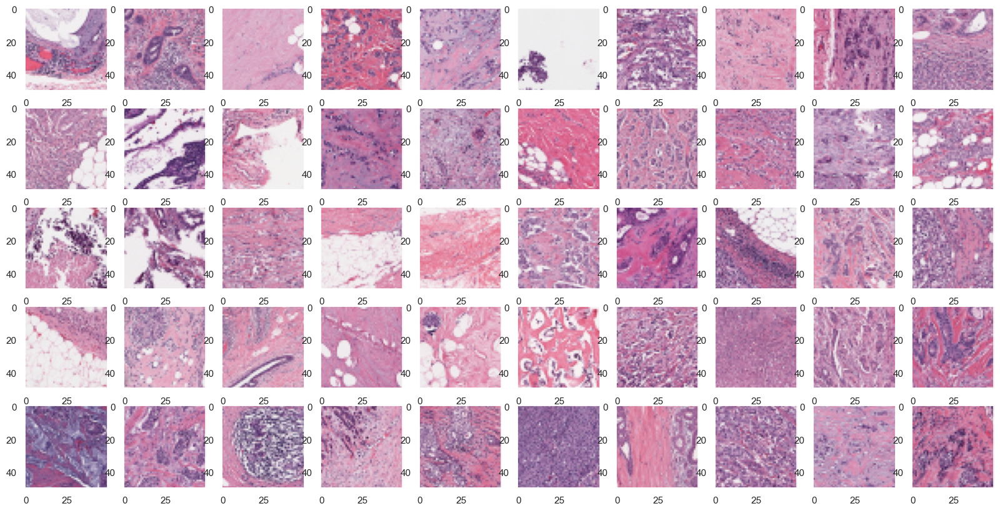

In [15]:
fig, ax = plt.subplots(5,10,figsize=(20,10))

for n in range(5):
    for m in range(10):
        idx = pos_selection[m + 10*n]
        image = imread(data.loc[idx, "path"])
        ax[n,m].imshow(image)
        ax[n,m].grid(False)

### Healthy patches

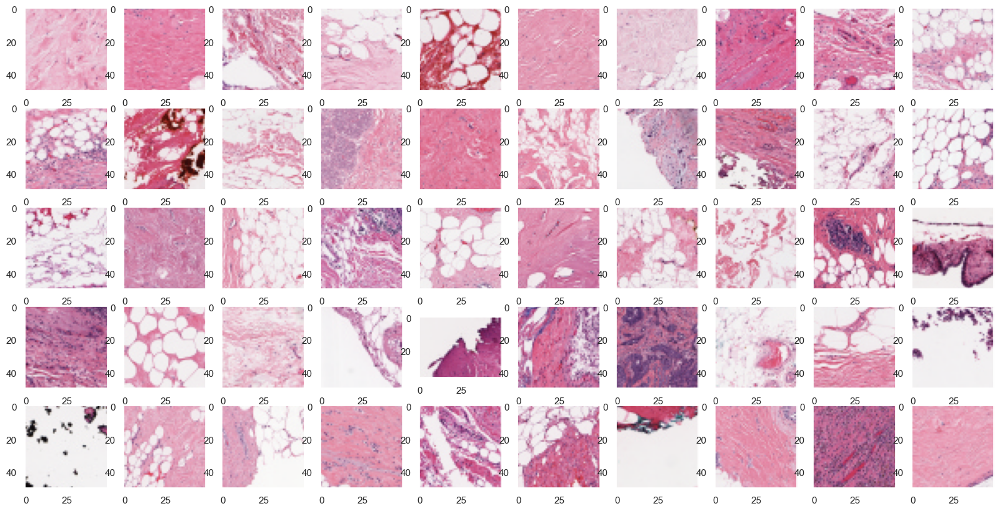

In [16]:
fig, ax = plt.subplots(5,10,figsize=(20,10))

for n in range(5):
    for m in range(10):
        idx = neg_selection[m + 10*n]
        image = imread(data.loc[idx, "path"])
        ax[n,m].imshow(image)
        ax[n,m].grid(False)

## Visualising the breast tissue <a class="anchor" id="tissue"></a>



In [17]:
def extract_coords(df):
    coord = df.path.str.rsplit("_", n=4, expand=True)
    coord = coord.drop([0, 1, 4], axis=1)
    coord = coord.rename({2: "x", 3: "y"}, axis=1)
    coord.loc[:, "x"] = coord.loc[:,"x"].str.replace("x", "", case=False).astype(int)
    coord.loc[:, "y"] = coord.loc[:,"y"].str.replace("y", "", case=False).astype(int)
    df.loc[:, "x"] = coord.x.values
    df.loc[:, "y"] = coord.y.values
    return df

In [18]:
def get_cancer_dataframe(patient_id, cancer_id):
    path = base_path + patient_id + "/" + cancer_id
    files = listdir(path)
    dataframe = pd.DataFrame(files, columns=["filename"])
    path_names = path + "/" + dataframe.filename.values
    dataframe = dataframe.filename.str.rsplit("_", n=4, expand=True)
    dataframe.loc[:, "target"] = int(cancer_id)
    dataframe.loc[:, "path"] = path_names
    dataframe = dataframe.drop([0, 1, 4], axis=1)
    dataframe = dataframe.rename({2: "x", 3: "y"}, axis=1)
    dataframe.loc[:, "x"] = dataframe.loc[:,"x"].str.replace("x", "", case=False).astype(int)
    dataframe.loc[:, "y"] = dataframe.loc[:,"y"].str.replace("y", "", case=False).astype(int)
    return dataframe

In [19]:
def get_patient_dataframe(patient_id):
    df_0 = get_cancer_dataframe(patient_id, "0")
    df_1 = get_cancer_dataframe(patient_id, "1")
    patient_df = df_0.append(df_1)
    return patient_df

In [20]:
example = get_patient_dataframe(data.patient_id.values[0])
example.head()

,x,y,target,path
0,1051,2401,0,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...
1,2951,951,0,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...
2,3001,1451,0,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...
3,3051,801,0,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...
4,951,1901,0,archive (3)/IDC_regular_ps50_idx5/9036/0/9036_...


### Binary target visualisation per tissue slice <a class="anchor" id="binarytissue"></a>

Before we will take a look at the whole tissue let's keep it a bit simpler by looking at the target structure in the x-y-space for a handful of patients:

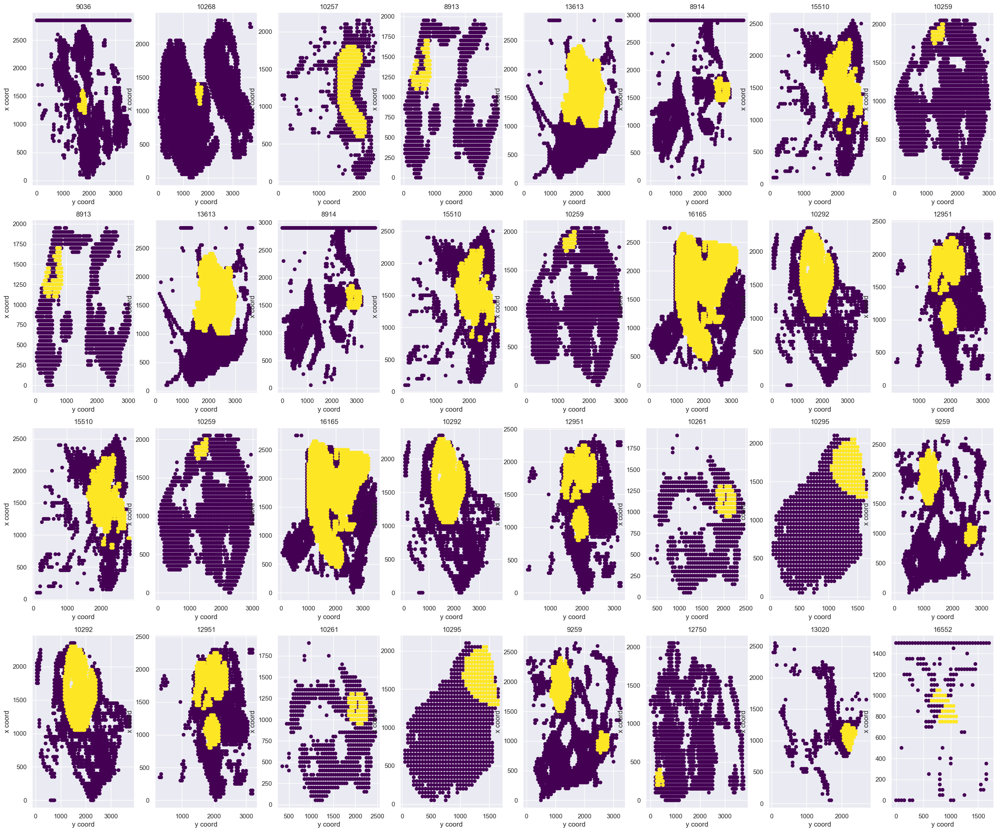

In [21]:
fig, ax = plt.subplots(4,8,figsize=(30, 25))

patient_ids = data.patient_id.unique()

for n in range(4):
    for m in range(8):
        patient_id = patient_ids[m + 3*n]
        example_df = get_patient_dataframe(patient_id)
        
        ax[n,m].scatter(example_df.x.values, example_df.y.values, c=example_df.target.values, cmap="viridis", s=30);
        ax[n,m].set_title(patient_id)
        ax[n,m].set_xlabel("y coord")
        ax[n,m].set_ylabel("x coord")

### Visualising the breast tissue images <a class="anchor" id="tissueimages"></a>



In [22]:
def visualise_breast_tissue(patient_id, pred_df=None):
    example_df = get_patient_dataframe(patient_id)
    max_point = [example_df.y.max()-1, example_df.x.max()-1]
    grid = 255*np.ones(shape = (max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    mask = 255*np.ones(shape = (max_point[0] + 50, max_point[1] + 50, 3)).astype(np.uint8)
    if pred_df is not None:
        patient_df = pred_df[pred_df.patient_id == patient_id].copy()
    mask_proba = np.zeros(shape = (max_point[0] + 50, max_point[1] + 50, 1)).astype(float)
    
    broken_patches = []
    for n in range(len(example_df)):
        try:
            image = imread(example_df.path.values[n])
            
            target = example_df.target.values[n]
            
            x_coord = int(example_df.x.values[n])
            y_coord = int(example_df.y.values[n])
            x_start = x_coord - 1
            y_start = y_coord - 1
            x_end = x_start + 50
            y_end = y_start + 50

            grid[y_start:y_end, x_start:x_end] = image
            if target == 1:
                mask[y_start:y_end, x_start:x_end, 0] = 250
                mask[y_start:y_end, x_start:x_end, 1] = 0
                mask[y_start:y_end, x_start:x_end, 2] = 0
            if pred_df is not None:
                
                proba = patient_df[
                    (patient_df.x==x_coord) & (patient_df.y==y_coord)].proba
                mask_proba[y_start:y_end, x_start:x_end, 0] = float(proba)

        except ValueError:
            broken_patches.append(example_df.path.values[n])
    
    
    return grid, mask, broken_patches, mask_proba

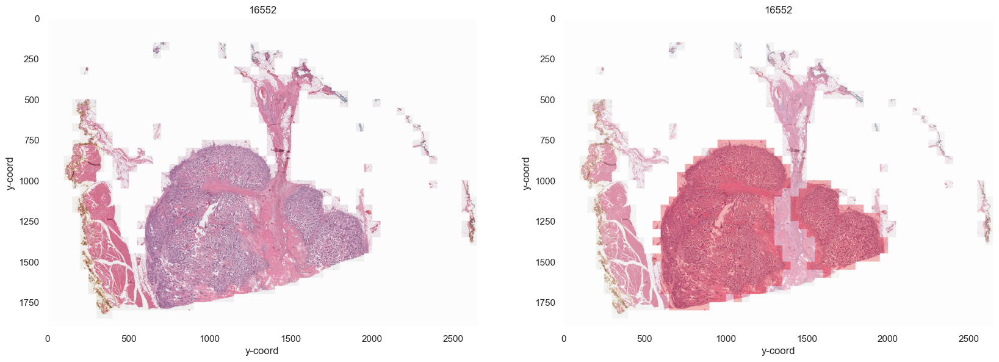

In [23]:
example = "16553"
grid, mask, broken_patches,_ = visualise_breast_tissue(example)

fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(grid, alpha=0.9)
ax[1].imshow(mask, alpha=0.8)
ax[1].imshow(grid, alpha=0.7)
ax[0].grid(False)
ax[1].grid(False)
for m in range(2):
    ax[m].set_xlabel("y-coord")
    ax[m].set_ylabel("y-coord")
ax[0].set_title(patient_id)
ax[1].set_title(patient_id);

<bound method _make_class_factory.<locals>.class_factory.<locals>.subcls.set of <AxesSubplot:xlabel='y-coord', ylabel='y-coord'>>

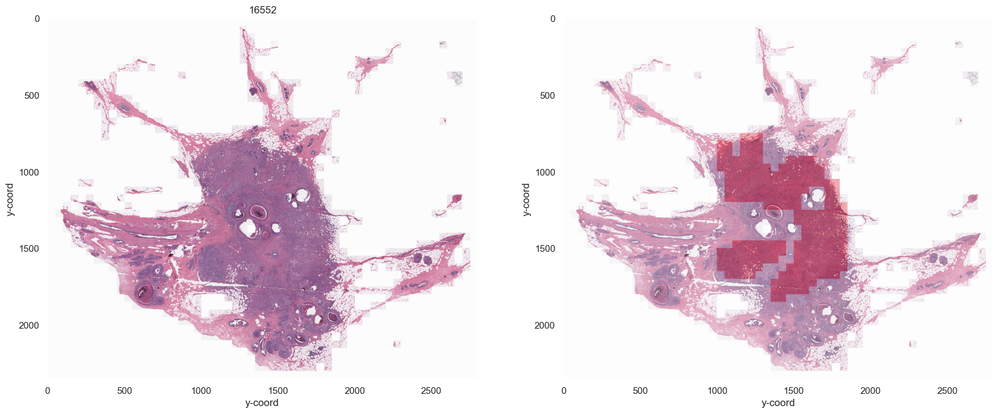

In [24]:
example = "8863"
grid, mask, broken_patches,_ = visualise_breast_tissue(example)

fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(grid, alpha=0.9)
ax[1].imshow(mask, alpha=0.8)
ax[1].imshow(grid, alpha=0.7)
ax[0].grid(False)
ax[1].grid(False)
for m in range(2):
    ax[m].set_xlabel("y-coord")
    ax[m].set_ylabel("y-coord")
ax[0].set_title(patient_id)
ax[1].set

In [27]:
broken_patches

['archive (3)/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1651_y2301_class0.png',
 'archive (3)/IDC_regular_ps50_idx5/8863/0/8863_idx5_x2751_y1551_class0.png',
 'archive (3)/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1751_y2301_class0.png',
 'archive (3)/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1701_y2301_class0.png']

In [200]:
BATCH_SIZE = 32
NUM_CLASSES = 2

import os


BASE_DIR = "bintasow/Downloads/Project bootcamp/breastcancermodel/BreastCancerModel/"
if not os.path.exists(BASE_DIR):
    os.makedirs(BASE_DIR)
MODEL_FILENAME = "breast_cancer_model.pth"
LOSSES_FILENAME = "loss_records.txt"
OUTPUT_PATH = os.path.join(BASE_DIR, MODEL_FILENAME)
MODEL_PATH = os.path.join(BASE_DIR, MODEL_FILENAME)
LOSSES_PATH = os.path.join(BASE_DIR, LOSSES_FILENAME)


In [29]:
torch.manual_seed(0)
np.random.seed(0)

In [30]:
data.head()
data.loc[:, "target"] = data.target.astype(str)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 277524 entries, 0 to 277523
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   patient_id  277524 non-null  object
 1   path        277524 non-null  object
 2   target      277524 non-null  object
dtypes: object(3)
memory usage: 16.5+ MB


In [58]:
patients = data.patient_id.unique()

train_ids, sub_test_ids = train_test_split(patients,
                                           test_size=0.3,
                                           random_state=0)
test_ids, dev_ids = train_test_split(sub_test_ids, test_size=0.5, random_state=0)

In [59]:
print(len(train_ids)/patients.shape[0]*100, len(dev_ids)/patients.shape[0]*100, len(test_ids)/patients.shape[0]*100)

69.89247311827957 15.053763440860216 15.053763440860216


Now it's 70 % train and 15 % for dev and test.

In [34]:
print(len(train_ids), len(dev_ids), len(test_ids))

195 42 42


In [36]:
train_df = data.loc[data.patient_id.isin(train_ids),:].copy()
test_df = data.loc[data.patient_id.isin(test_ids),:].copy()
dev_df = data.loc[data.patient_id.isin(dev_ids),:].copy()

train_df = extract_coords(train_df)
test_df = extract_coords(test_df)
dev_df = extract_coords(dev_df)

In [60]:
def my_transform(key="train", plot=False):
    train_sequence = [transforms.Resize((50,50)),
                      transforms.RandomHorizontalFlip(),
                      transforms.RandomVerticalFlip()]
    val_sequence = [transforms.Resize((50,50))]
    if plot==False:
        train_sequence.extend([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
        val_sequence.extend([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
        
    data_transforms = {'train': transforms.Compose(train_sequence),'val': transforms.Compose(val_sequence)}
    return data_transforms[key]

In [61]:
class BreastCancerDataset(Dataset):
    
    def __init__(self, df, transform=None):
        self.states = df
        self.transform=transform
      
    def __len__(self):
        return len(self.states)
        
    def __getitem__(self, idx):
        patient_id = self.states.patient_id.values[idx]
        x_coord = self.states.x.values[idx]
        y_coord = self.states.y.values[idx]
        image_path = self.states.path.values[idx] 
        image = Image.open(image_path)
        image = image.convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        if "target" in self.states.columns.values:
            target = int(self.states.target.values[idx])
        else:
            target = None
            
        return {"image": image,
                "label": target,
                "patient_id": patient_id,
                "x": x_coord,
                "y": y_coord}

In [65]:
train_dataset = BreastCancerDataset(train_df, transform=my_transform(key="train"))
dev_dataset = BreastCancerDataset(dev_df, transform=my_transform(key="val"))
test_dataset = BreastCancerDataset(test_df, transform=my_transform(key="val"))

In [63]:
image_datasets = {"train": train_dataset, "dev": dev_dataset, "test": test_dataset}
dataset_sizes = {x: len(image_datasets[x]) for x in ["train", "dev", "test"]}

In [66]:
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
dev_dataloader = DataLoader(dev_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=False)

In [67]:
dataloaders = {"train": train_dataloader, "dev": dev_dataloader, "test": test_dataloader}

In [68]:
print(len(dataloaders["train"]), len(dataloaders["dev"]), len(dataloaders["test"]))

6043 1272 1357


In [69]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device


device(type='cpu')

In [70]:
!pip install efficientnet_pytorch

In [153]:
weights = compute_class_weight(y=train_df.target.values, class_weight="balanced", classes=train_df.target.unique())    
class_weights = torch.FloatTensor(weights)
if device.type=="cuda":
    class_weights = class_weights.cuda()
print(class_weights)

tensor([0.6896, 1.8184])


In [154]:
train_df.target.unique()

array(['0', '1'], dtype=object)

In [155]:
criterion = nn.CrossEntropyLoss()

In [159]:
def get_resnext():
    model = torchvision.models.resnext50_32x4d(pretrained=False)
    model.avgpool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
    num_features = model.fc.in_features
    model.fc = nn.Linear(in_features=num_features, out_features=2, bias=True)
    return model



def get_eff_net():
    model = EfficientNet.from_pretrained('efficientnet-b0')
    model._avg_pooling = nn.AdaptiveAvgPool2d(output_size=(1, 1))
    num_features = model._fc.in_features
    model._fc = nn.Linear(in_features=num_features, out_features=2, bias=True)
    return model


# Get the ResNeXt model
resnext_model = get_resnext()

# Get the EfficientNet model
eff_net_model = get_eff_net()

# Combine the models
class CombinedModel(nn.Module):
    def __init__(self, resnext_model, eff_net_model):
        super(CombinedModel, self).__init__()
        self.resnext_model = resnext_model
        self.eff_net_model = eff_net_model

    def forward(self, x):
        resnext_output = self.resnext_model(x)
        eff_net_output = self.eff_net_model(x)
        combined_output = (resnext_output + eff_net_output) / 2  
        return combined_output

combined_model = CombinedModel(resnext_model, eff_net_model)


Loaded pretrained weights for efficientnet-b0


In [161]:
optimizer = optim.Adam(combined_model.parameters(), lr=0.003)

In [ ]:
from tqdm import tqdm

def find_best_lr(combined_model, criterion, optimizer, dataloaders, device, num_lr_steps=100, lr_range=(1e-6, 1)):
    model.train()
    lr_values = torch.logspace(*lr_range, num=num_lr_steps)
    lr_losses = []

    for lr in lr_values:
        optimizer.param_groups[0]['lr'] = lr
        running_loss = 0.0

        for inputs, labels in dataloaders["train"]:
            inputs = inputs.to(device, dtype=torch.float)
            labels = labels.to(device, dtype=torch.long)

            optimizer.zero_grad()
            outputs = combined_model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_loss = running_loss / len(dataloaders["train"])
        lr_losses.append(avg_loss)

    return lr_values, lr_losses

In [167]:
def train_loop(combined_model, criterion, optimizer, dataloaders, dataset_sizes, device, lr_find=False, scheduler=None, num_epochs=2, lam=0.0):
    since = time.time()
    if lr_find:
        phases = ["train"]
    else:
        phases = ["train", "dev", "test"]

    best_model_wts = copy.deepcopy(combined_model.state_dict())
    best_acc = 0.0

    loss_dict = {"train": [], "dev": [], "test": []}
    lam_tensor = torch.tensor(lam, device=device)

    running_loss_dict = {"train": [], "dev": [], "test": []}

    if lr_find:
        lr_values, lr_losses = find_best_lr(combined_model, criterion, optimizer, dataloaders, device)
        

    smoothing = 0.2

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        for phase in phases:
            if phase == "train":
                combined_model.train()
            else:
                combined_model.eval()

            running_loss = 0.0
            running_corrects = 0

            dataloader = dataloaders[phase]  
            tk0 = tqdm(dataloader, total=int(len(dataloader)))

            counter = 0
            for bi, d in enumerate(tk0):
                inputs = d["image"]
                labels = d["label"]
                inputs = inputs.to(device, dtype=torch.float)
                labels = labels.to(device, dtype=torch.long)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = combined_model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()

                        optimizer.step()
                        if scheduler is not None:
                            scheduler.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                counter += 1

                tk0.set_postfix({'loss': running_loss / (counter * dataloaders[phase].batch_size),
                                 'accuracy': running_corrects.double() / (counter * dataloaders[phase].batch_size)})
                running_loss_dict[phase].append(running_loss / (counter * dataloaders[phase].batch_size))

            epoch_loss = running_loss / dataset_sizes[phase]
            loss_dict[phase].append(epoch_loss)
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            if phase == 'dev' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(combined_model.state_dict())
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    combined_model.load_state_dict(best_model_wts)
    results = {"combined_model": combined_model,
               "loss_dict": loss_dict,
               "running_loss_dict": running_loss_dict}
    if lr_find:
        results["lr_find"] = {"lr": lr_values, "loss": lr_losses}
    return results


In [168]:
resluts = train_loop(combined_model, criterion, optimizer, dataloaders, dataset_sizes, device, lr_find=False, scheduler=None, num_epochs=2, lam=0.0)

Epoch 0/1
----------


100%|██████████| 6043/6043 [5:16:24<00:00,  3.14s/it, loss=0.305, accuracy=tensor(0.8707, dtype=torch.float64)]  


train Loss: 0.3053 Acc: 0.8706


100%|██████████| 1272/1272 [11:31<00:00,  1.84it/s, loss=0.31, accuracy=tensor(0.8621, dtype=torch.float64)] 


dev Loss: 0.3095 Acc: 0.8617


100%|██████████| 1357/1357 [12:14<00:00,  1.85it/s, loss=0.365, accuracy=tensor(0.8488, dtype=torch.float64)]


test Loss: 0.3655 Acc: 0.8492

Epoch 1/1
----------


100%|██████████| 6043/6043 [4:56:38<00:00,  2.95s/it, loss=0.295, accuracy=tensor(0.8755, dtype=torch.float64)]    


train Loss: 0.2945 Acc: 0.8754


100%|██████████| 1272/1272 [09:54<00:00,  2.14it/s, loss=0.305, accuracy=tensor(0.8642, dtype=torch.float64)]


dev Loss: 0.3053 Acc: 0.8638


100%|██████████| 1357/1357 [1:03:42<00:00,  2.82s/it, loss=0.335, accuracy=tensor(0.8620, dtype=torch.float64)]  


test Loss: 0.3354 Acc: 0.8624

Training complete in 710m 27s
Best val Acc: 0.863808


In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(results["loss_dict"]["train"], label="Train Loss")
plt.plot(results["loss_dict"]["dev"], label="Dev Loss")
plt.plot(results["loss_dict"]["test"], label="Test Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss change over epoch")
plt.title("weighted x-entropy")
plt.legend()
plt.show()

In [202]:
def sigmoid(x):
    return 1. / (1 + np.exp(-x))

def evaluate_model(combined_model, dataloaders, device, key):
    was_training = model.training
    model.eval()

    proba_list, true_list, predicted_list, x_list, y_list, patient_id_list = [], [], [], [], [], []

    with torch.no_grad():
        for i, data in enumerate(dataloaders[key]):
            inputs = data["image"].to(device)
            labels = data["label"].to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            proba = outputs.cpu().numpy().astype(float)

            proba_list.extend(sigmoid(proba[:, 1]))
            true_list.extend(labels.cpu().numpy().astype(int))
            predicted_list.extend(preds.cpu().numpy().astype(int))
            x_list.extend(data["x"].numpy())
            y_list.extend(data["y"].numpy())
            patient_id_list.extend(data["patient_id"])

    predictions_df = pd.DataFrame({
        "proba": proba_list,
        "true": true_list,
        "predicted": predicted_list,
        "x": x_list,
        "y": y_list,
        "patient_id": patient_id_list
    })

    if was_training:
        model.train()

    return predictions_df

if run_training:
    dev_predictions = evaluate_model(combined_model, dataloaders, device, "dev")
    test_predictions = evaluate_model(combined_model, dataloaders, device, "test")

    dev_predictions.to_csv("dev_predictions.csv", index=False)
    test_predictions.to_csv("test_predictions.csv", index=False)
else:
    dev_predictions = pd.read_csv(LOSSES_PATH + "dev_predictions.csv")
    test_predictions = pd.read_csv(LOSSES_PATH + "test_predictions.csv")

    dev_predictions["patient_id"] = dev_predictions["patient_id"].astype(str)
    test_predictions["patient_id"] = test_predictions["patient_id"].astype(str)


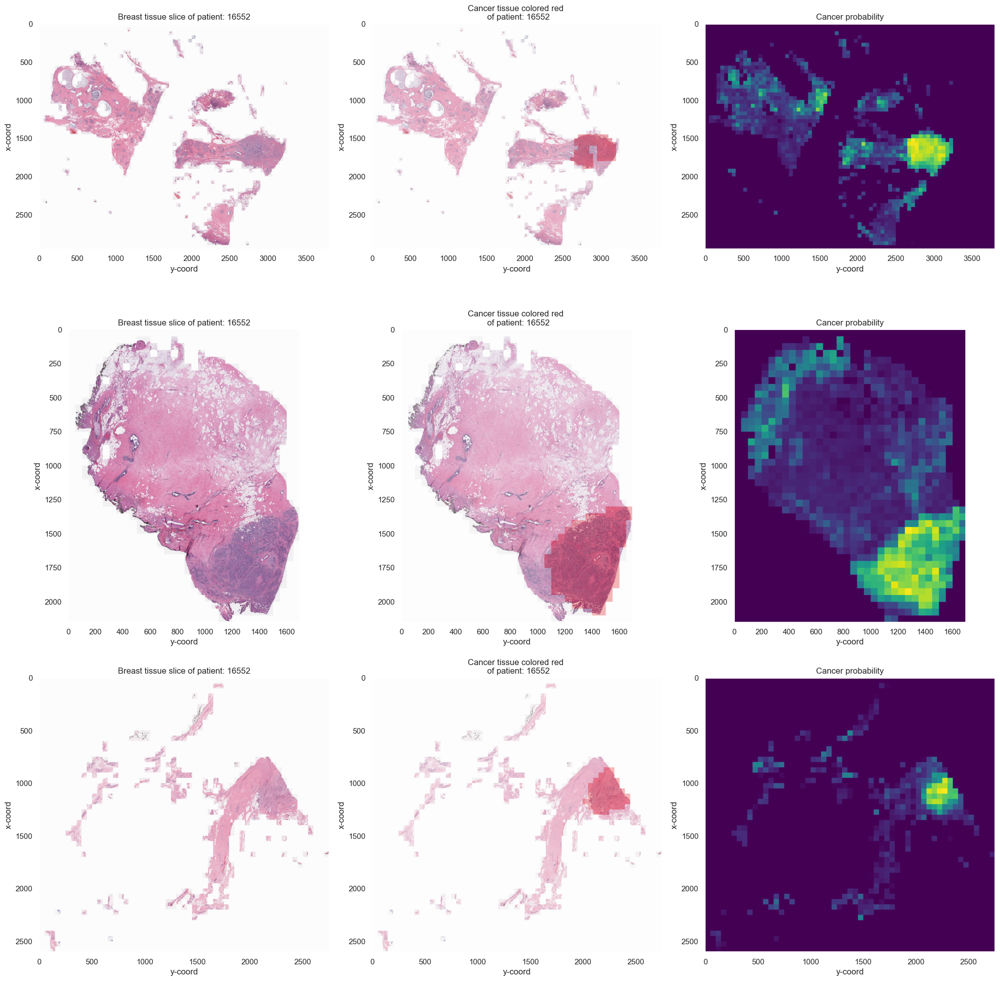

In [212]:
fig, ax = plt.subplots(3, 3, figsize=(20, 20))

for n in range(3):
    idx = dev_predictions.patient_id.unique()[n]
    grid, mask, broken_patches, mask_proba = visualise_breast_tissue(idx, pred_df=dev_predictions)

    ax[n, 0].imshow(grid, alpha=0.9)
    ax[n, 1].imshow(mask, alpha=0.8)
    ax[n, 1].imshow(grid, alpha=0.7)
    ax[n, 2].imshow(mask_proba[:, :, 0], cmap="viridis")

    for m in range(3):
        ax[n, m].set_xlabel("y-coord")
        ax[n, m].set_ylabel("x-coord")
        ax[n, m].grid(False)

    # Assuming you have a variable 'patient_id' defined somewhere in your loop
    ax[n, 0].set_title("Breast tissue slice of patient: " + patient_id)
    ax[n, 1].set_title("Cancer tissue colored red \n of patient: " + patient_id)
    ax[n, 2].set_title("Cancer probability")

plt.tight_layout()
plt.show()


In [215]:
dev_predictions.head()

,proba,true,predicted,x,y,patient_id
0,0.269808,0,0,651,1251,8914
1,0.140167,0,0,701,1101,8914
2,0.054251,0,0,2501,2251,8914
3,0.203487,0,0,801,551,8914
4,0.150972,0,0,2351,2901,8914


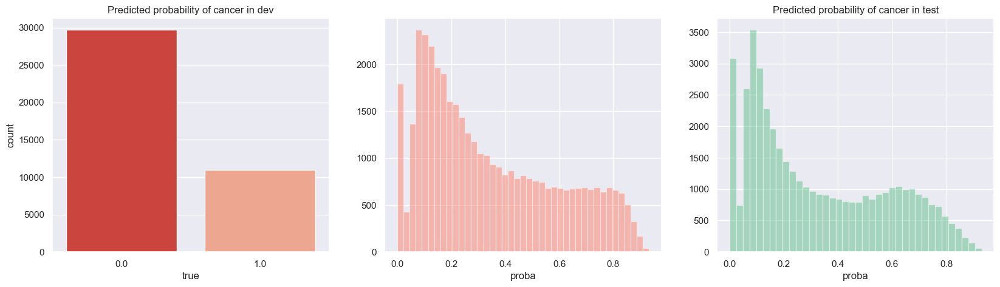

In [218]:
fig, ax = plt.subplots(1,3,figsize=(20,5))
sns.countplot(dev_predictions.true.astype(float), ax=ax[0], palette="Reds_r")
ax[0].set_title("Target counts of dev data");
sns.distplot(dev_predictions.proba.astype(float), ax=ax[1], kde=False, color="tomato")
ax[0].set_title("Predicted probability of cancer in dev");
sns.distplot(test_predictions.proba.astype(float), ax=ax[2], kde=False, color="mediumseagreen");
ax[2].set_title("Predicted probability of cancer in test");

In [221]:
from sklearn.metrics import confusion_matrix
true_labels = dev_predictions["true"]
predicted_labels = dev_predictions["predicted"]

conf_matrix = confusion_matrix(true_labels, predicted_labels)


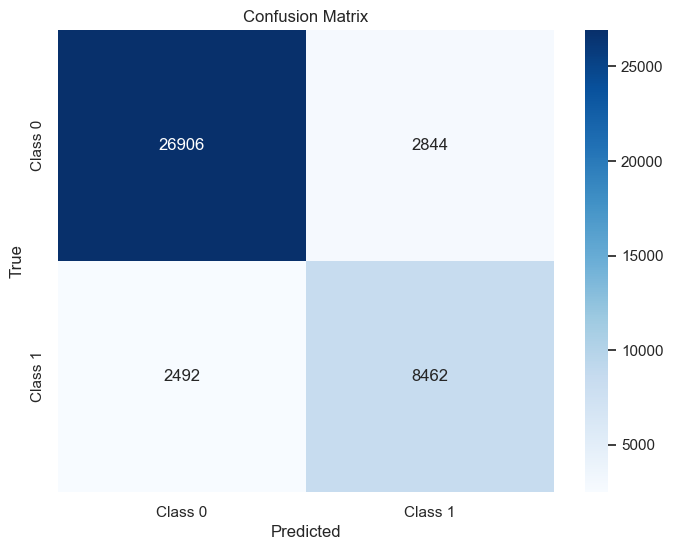

In [222]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


# Conclusion <a class="anchor" id="conclusion"></a>

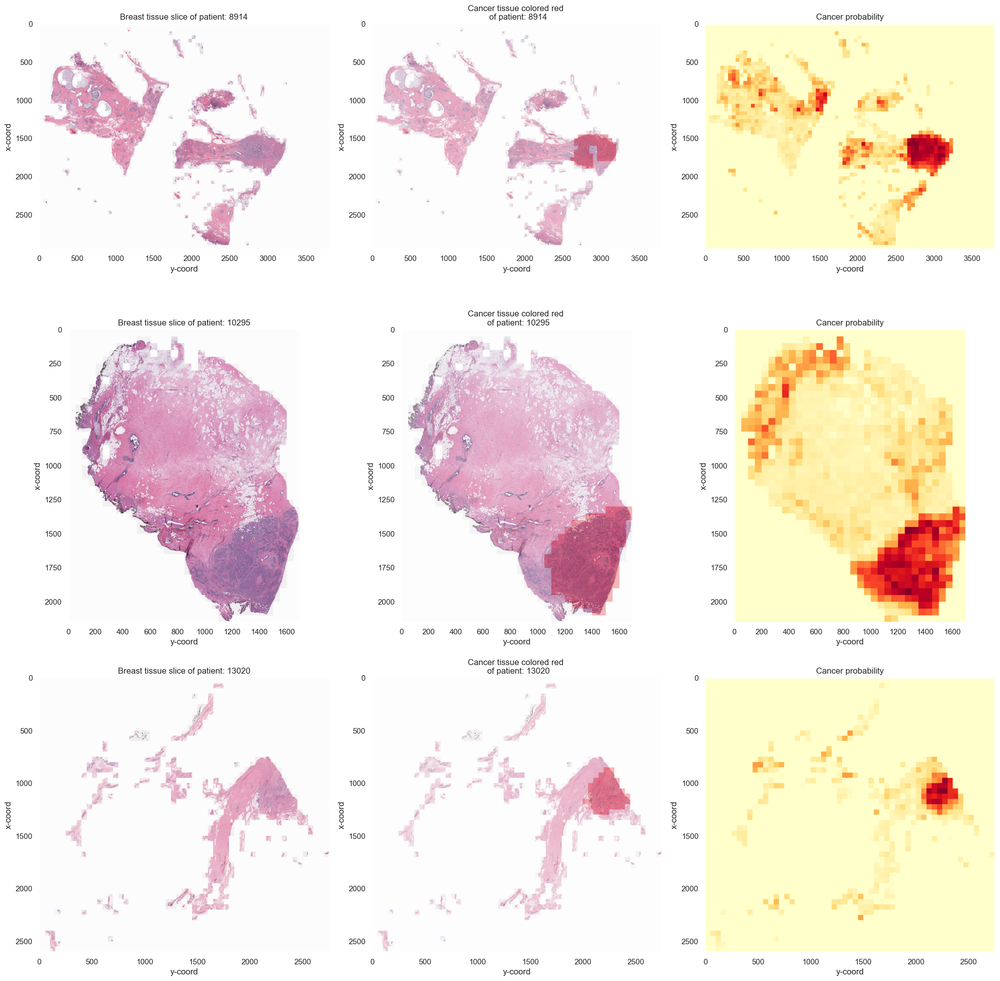

In [224]:
fig, ax = plt.subplots(3, 3, figsize=(20, 20))

for n in range(3):
    idx = dev_predictions.patient_id.unique()[n]
    grid, mask, broken_patches, mask_proba = visualise_breast_tissue(idx, pred_df=dev_predictions)

    ax[n, 0].imshow(grid, alpha=0.9)
    ax[n, 1].imshow(mask, alpha=0.8)
    ax[n, 1].imshow(grid, alpha=0.7)
    ax[n, 2].imshow(mask_proba[:, :, 0], cmap="YlOrRd")

    for m in range(3):
        ax[n, m].set_xlabel("y-coord")
        ax[n, m].set_ylabel("x-coord")
        ax[n, m].grid(False)

    patient_id = str(idx)  # Replace this with how you extract patient_id
    ax[n, 0].set_title("Breast tissue slice of patient: " + patient_id)
    ax[n, 1].set_title("Cancer tissue colored red \n of patient: " + patient_id)
    ax[n, 2].set_title("Cancer probability")

plt.tight_layout()
plt.show()


This work draws inspiration from {https://www.kaggle.com/code/allunia/breast-cancer}.
a prior study and utilizes a segment of the code provided here; however, it's important to note that these two works are distinct in nature. While the initial aim was to enhance the existing work, a thorough comparison revealed that our approach significantly outperformed it.